In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
%matplotlib inline
import re
from skimage import io, exposure
from matplotlib import pyplot as plt
matplotlib.rcParams.update({'font.size': 20})


In [2]:
import fnmatch 
import os 
files = []
for root, dirnames, filenames in os.walk('data/Nairobi'): 
    for filename in fnmatch.filter(filenames, '*B10.TIF'): 
        files.append(os.path.join(root, filename))    

In [3]:
file = files[2]
band10file = file

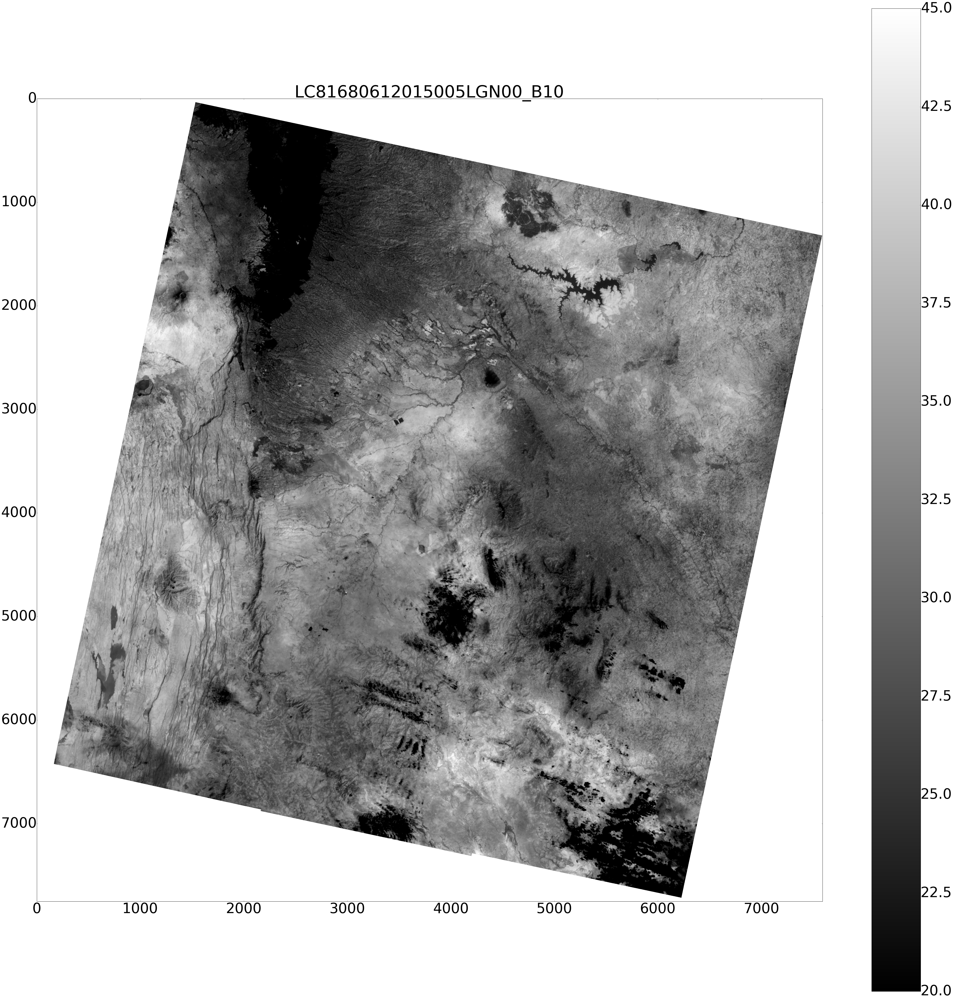

In [5]:
file = files[2]
band10file = file
title = os.path.splitext(os.path.basename(file))[0]
band10 = mpimg.imread(band10file)
# convert from digital numbers to (spectral) radiance
m_l = 3.3420E-04 # gain
a_l = 0.10000 # bias
radiance = m_l * band10 + a_l
# convert from radiance to temperature by inverting the planck function
k1 = 774.8853 
k2 = 1321.0789
temp = k2/ (np.log(k1/radiance +1)) -273.15
temp[temp < -100] = 'nan'
matplotlib.rcParams.update({'font.size': 60})
fig  = plt.figure(figsize=(75, 75))
imgplot = plt.imshow(temp, 
                         cmap = 'gray', #matplotlib.cm.RdBu_r, #matplotlib.cm.OrRd,
                         vmin = 20,
                         vmax = 45,
                         )
plt.colorbar()
plt.title(title)
plt.savefig('LSTcolorbar%s.eps'%title)

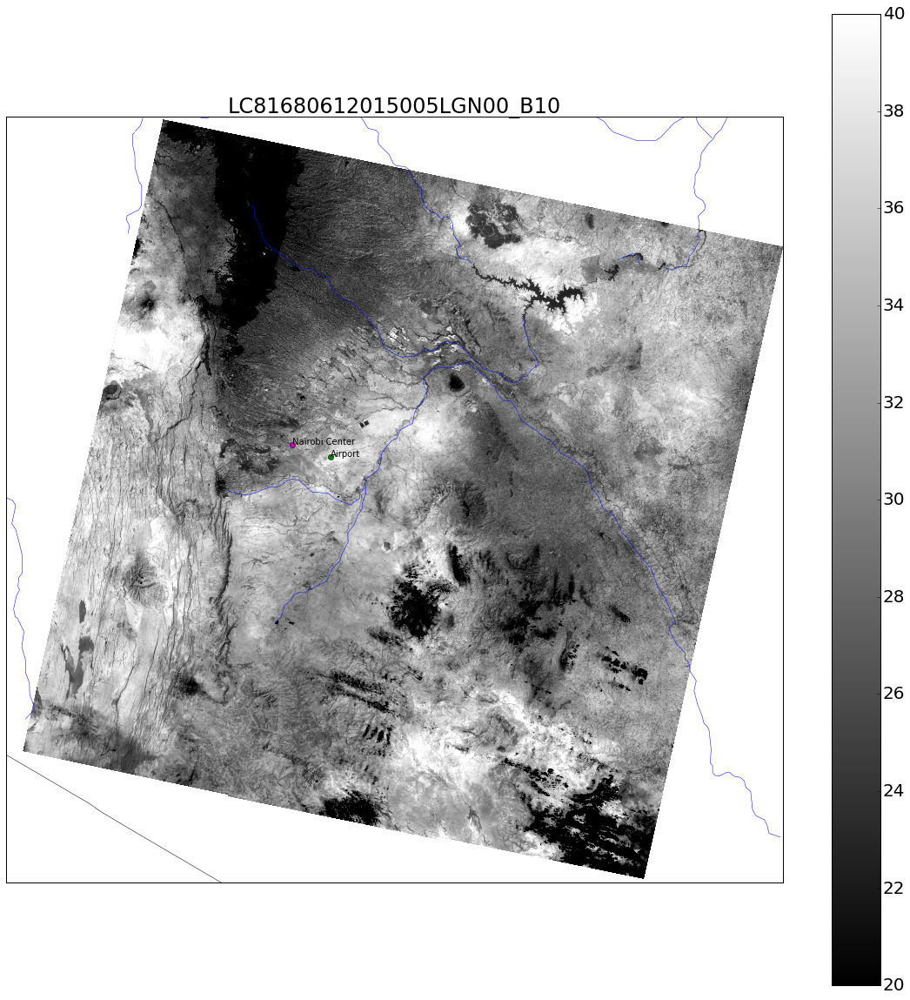

In [14]:
fig = plt.figure(figsize=[20,20])
from mpl_toolkits.basemap import Basemap
m = Basemap(llcrnrlon = 36.07422, 
            llcrnrlat  = -2.49919, 
            urcrnrlon  =38.12201, 
            urcrnrlat  = -0.39894,
            projection = 'tmerc', 
            lat_0 = 0, 
            lon_0 = 3, 
            resolution = 'h',
            )

m.drawrivers(color = 'blue')
m.drawcountries()
x,y = m(36.821790, -1.292166)
m.plot(x,y, marker = 'o', color = 'm', )
plt.annotate('Nairobi Center', xy = (x,y), xycoords = 'data', fontsize = 10)

x,y = m(36.924841, -1.323374 )
m.plot(x,y, marker = 'o', color = 'g')
plt.annotate('Airport', xy = (x,y), xycoords = 'data', fontsize = 10)

lllon = 36.475193
lllat = -1.496
urlon = 37.131626
urlat = -1.004099
x, y = m((lllon, urlon), (lllat, urlat))
m.imshow(temp, cmap = 'gray', #matplotlib.cm.RdBu_r,#
        vmin = 20,
        vmax = 40,
        origin = 'upper'
         #extent = [x[0], x[1], y[0], y[1]],
         )
plt.colorbar()
title = os.path.splitext(os.path.basename(file))[0]
plt.title(title)
plt.savefig('LSTcolorbarNairobi.eps')

In [4]:
# from http://invisibleroads.com/tutorials/gdal-raster-extract.html
import struct, numpy, pylab

def extractWindow(pixelX, pixelY, pixelWidth, pixelHeight):
    # Extract raw data
    band = imageDataset.GetRasterBand(1)
    #byteString = band.ReadRaster(pixelX, pixelY, pixelWidth, pixelHeight)
    # Convert to a matrix
    #valueType = {osgeo.gdal.GDT_Byte: 'B', osgeo.gdal.GDT_UInt16: 'H'}[band.DataType]
    values = band.ReadAsArray(pixelX, pixelY,pixelWidth, pixelHeight)
    #values = struct.unpack('%d%s' % (pixelWidth * pixelHeight, valueType), byteString)
    matrix = numpy.reshape(values, (pixelWidth, pixelHeight))
    
    # Display matrix
    pylab.imshow(matrix, cmap=pylab.cm.gray)
    pylab.show()
    # Return
    return matrix

def extractCenteredWindow(pixelX, pixelY, pixelWidth, pixelHeight):
    centeredPixelX = pixelX - pixelWidth / 2
    centeredPixelY = pixelY - pixelHeight / 2
    return extractWindow(centeredPixelX, centeredPixelY, pixelWidth, pixelHeight)

def convertGeoLocationToPixelLocation(geoLocation):
    xGeo, yGeo = geoLocation
    if g2 == 0:
        xPixel = (xGeo - g0) / float(g1)
        yPixel = (yGeo - g3 - xPixel*g4) / float(g5)
    else:
        xPixel = (yGeo*g2 - xGeo*g5 + g0*g5 - g2*g3) / float(g2*g4 - g1*g5)
        yPixel = (xGeo - g0 - xPixel*g1) / float(g2)
    return int(round(xPixel)), int(round(yPixel))

def convertGeoDimensionsToPixelDimensions(geoWidth, geoHeight):
    return int(round(abs(float(geoWidth) / g1))), int(round(abs(float(geoHeight) / g5)))

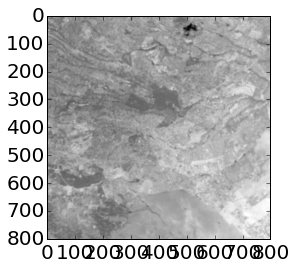

In [19]:
import osgeo.gdal
# UTM coordinates 
# Nairobi Railway: -1.290823, 36.825190
xxx = 258000.6 
yyy = 9857221.5 

imageDataset = osgeo.gdal.Open(file)
g0, g1, g2, g3, g4, g5 = imageDataset.GetGeoTransform()
band = imageDataset.GetRasterBand(1)
#values = band.ReadAsArray(0,0, imageDataset.RasterXSize, imageDataset.RasterYSize)

pixelX, pixelY = convertGeoLocationToPixelLocation([xxx,yyy])
#pixelWidth, pixelHeight = convertGeoDimensionsToPixelDimensions(100, 100)
matrix = extractCenteredWindow(pixelX, 3200, 800, 800)

m_l = 3.3420E-04 # gain
a_l = 0.10000 # bias
radiance = m_l * matrix + a_l
# convert from radiance to temperature by inverting the planck function
k1 = 774.8853 
k2 = 1321.0789
temp = k2/ (np.log(k1/radiance +1)) -273.15

In [9]:
values = band.ReadAsArray()

In [20]:
print pixelX, 32

(2781, -330044)

In [21]:
g0, g1, g2, g3, g4, g5 

(174585.0, 30.0, 0.0, -44085.0, 0.0, -30.0)

In [17]:
values.shape

(7751, 7591)